<a href="https://colab.research.google.com/github/ijazawan91/INSA6220/blob/main/INSE6220_final_file.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Multiclass Classification with PyCaret**

**Install Pycaret**

In [ ]:
!pip install pycaret==2.3.6

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from pycaret.utils import version
version()

'2.3.6'

**Import Libraries**

In [ ]:
import numpy as np

# Open source data analysis and manipulation library for Python
import pandas as pd

# matplotlib - The Python library is needed to plot nice charts
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = (7,5)

# 'seaborn' - a matplotlib based statistical graphical library
import seaborn as sns; 
sns.set() # Use seaborn plotting style defaults
sns.set_theme(style="darkgrid")


from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  1.3.5
Seaborn version:  0.11.2


**Dataset**

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/ijazawan91/INSA6220/main/less%20rows%20gonen.csv')
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,3393,84.058480,52.951486,0.776647,3477,65.727481,0.688515,224.485,0.846095,1.587462,jasmine
1,4038,95.247094,55.219372,0.814795,4126,71.703147,0.636106,244.287,0.850306,1.724885,jasmine
2,3899,95.376228,53.326678,0.829087,3977,70.458222,0.642128,240.440,0.847519,1.788527,jasmine
3,4399,102.448560,55.731542,0.839088,4496,74.839700,0.755842,257.268,0.835203,1.838251,jasmine
4,4893,108.983250,58.029991,0.846451,4979,78.930103,0.625224,268.932,0.850159,1.878050,jasmine
5,4357,104.168804,54.503692,0.852195,4432,74.481573,0.537968,260.732,0.805395,1.911225,jasmine
6,4105,101.842276,52.147372,0.858961,4241,72.295562,0.838440,254.662,0.795417,1.952970,jasmine
7,4371,106.036504,53.383240,0.864029,4460,74.601140,0.623716,256.509,0.834806,1.986326,jasmine
8,3641,98.218981,48.839391,0.867607,3726,68.087188,0.554946,241.542,0.784233,2.011061,jasmine
9,4881,113.816097,55.966749,0.870748,4965,78.833256,0.852725,275.478,0.808248,2.033638,jasmine


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1136 entries, 0 to 1135
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             1136 non-null   int64  
 1   MajorAxisLength  1136 non-null   float64
 2   MinorAxisLength  1136 non-null   float64
 3   Eccentricity     1136 non-null   float64
 4   ConvexArea       1136 non-null   int64  
 5   EquivDiameter    1136 non-null   float64
 6   Extent           1136 non-null   float64
 7   Perimeter        1136 non-null   float64
 8   Roundness        1136 non-null   float64
 9   AspectRation     1136 non-null   float64
 10  Class            1136 non-null   object 
dtypes: float64(8), int64(2), object(1)
memory usage: 97.8+ KB


In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [ ]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

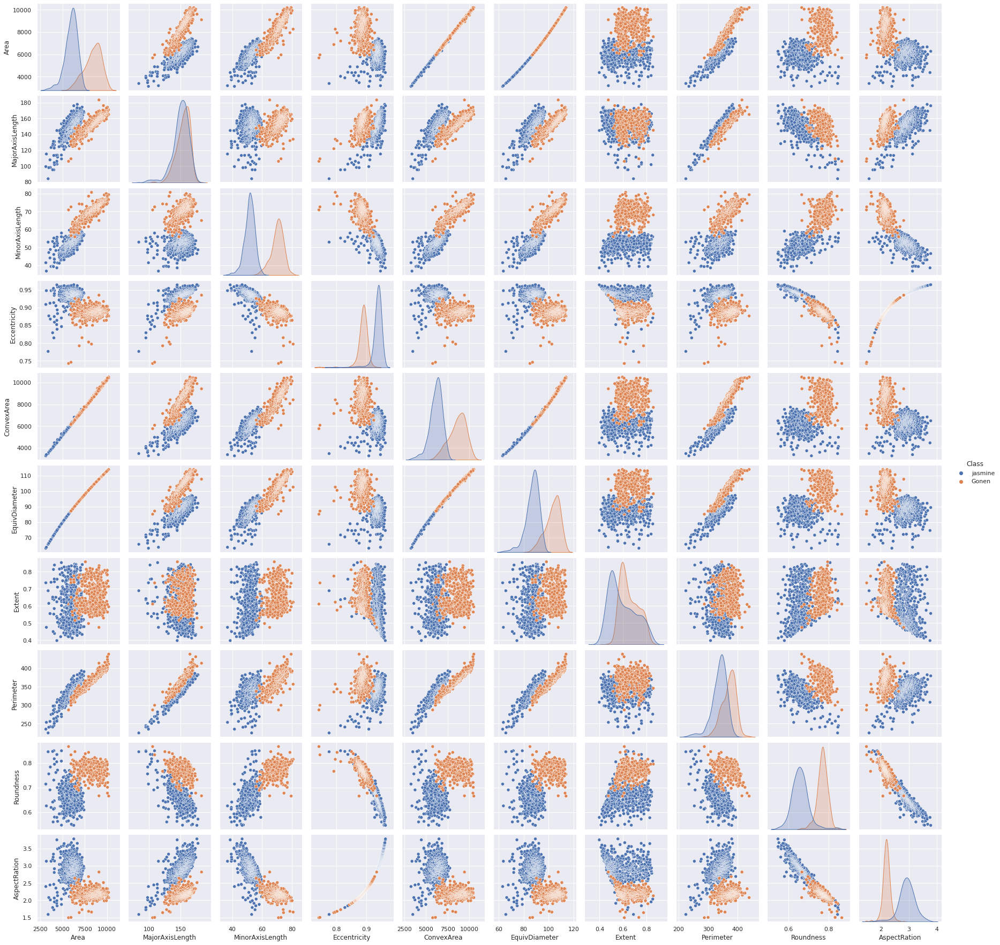

In [ ]:
sns.pairplot(df, hue='Class')
plt.show()

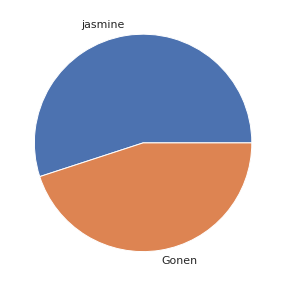

In [ ]:
y = df['Class']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [ ]:
X = df.drop(columns=['Class'])
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,3393,84.058480,52.951486,0.776647,3477,65.727481,0.688515,224.485,0.846095,1.587462
1,4038,95.247094,55.219372,0.814795,4126,71.703147,0.636106,244.287,0.850306,1.724885
2,3899,95.376228,53.326678,0.829087,3977,70.458222,0.642128,240.440,0.847519,1.788527
3,4399,102.448560,55.731542,0.839088,4496,74.839700,0.755842,257.268,0.835203,1.838251
4,4893,108.983250,58.029991,0.846451,4979,78.930103,0.625224,268.932,0.850159,1.878050
5,4357,104.168804,54.503692,0.852195,4432,74.481573,0.537968,260.732,0.805395,1.911225
6,4105,101.842276,52.147372,0.858961,4241,72.295562,0.838440,254.662,0.795417,1.952970
7,4371,106.036504,53.383240,0.864029,4460,74.601140,0.623716,256.509,0.834806,1.986326
8,3641,98.218981,48.839391,0.867607,3726,68.087188,0.554946,241.542,0.784233,2.011061
9,4881,113.816097,55.966749,0.870748,4965,78.833256,0.852725,275.478,0.808248,2.033638


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,1136.0,7063.028169,1462.599910,3136.000000,5976.500000,6699.500000,8378.500000,10192.000000
MajorAxisLength,1136.0,152.039301,12.222012,84.058480,145.873588,153.928684,160.675742,183.211434
MinorAxisLength,1136.0,59.890503,10.010090,36.770882,51.488454,55.762288,70.088053,80.764685
Eccentricity,1136.0,0.915746,0.029562,0.742741,0.891712,0.923447,0.941288,0.964354
ConvexArea,1136.0,7251.144366,1496.840129,3270.000000,6133.750000,6877.500000,8617.750000,10512.000000
EquivDiameter,1136.0,94.319057,9.845176,63.189233,87.232540,92.358369,103.285223,113.916010
Extent,1136.0,0.620800,0.102420,0.397455,0.541615,0.608994,0.697429,0.857353
Perimeter,1136.0,352.073120,29.114357,224.485000,335.439500,352.664000,372.168000,438.473000
Roundness,1136.0,0.708726,0.066160,0.547319,0.652003,0.702355,0.769728,0.867290
AspectRation,1136.0,2.600799,0.431418,1.493476,2.209443,2.606028,2.962034,3.779068


**Standardize the Data**

In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns

X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation
0,-2.510355,-5.564612,-0.693508,-4.707473,-2.522518,-2.905399,0.661431,-4.384239,2.077237,-2.349887
1,-2.069165,-4.648761,-0.466848,-3.416431,-2.088747,-2.298168,0.149503,-3.703794,2.140922,-2.031208
2,-2.164243,-4.638191,-0.656010,-2.932757,-2.188334,-2.424674,0.208325,-3.835987,2.098778,-1.883625
3,-1.822236,-4.059281,-0.415660,-2.594301,-1.841451,-1.979440,1.319083,-3.257735,1.912541,-1.768318
4,-1.484332,-3.524380,-0.185946,-2.345135,-1.518629,-1.563784,0.043206,-2.856932,2.138691,-1.676025
5,-1.850964,-3.918469,-0.538375,-2.150743,-1.884227,-2.015832,-0.809109,-3.138704,1.461785,-1.599095
6,-2.023336,-4.108909,-0.773873,-1.921747,-2.011885,-2.237969,2.125895,-3.347284,1.310903,-1.502289
7,-1.841388,-3.765588,-0.650357,-1.750244,-1.865512,-2.003682,0.028477,-3.283817,1.906528,-1.424939
8,-2.340719,-4.405496,-1.104484,-1.629144,-2.356095,-2.665612,-0.643266,-3.798119,1.141790,-1.367580
9,-1.492540,-3.128784,-0.392153,-1.522857,-1.527986,-1.573626,2.265438,-2.631995,1.504937,-1.315224


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Area,1136.0,-5.003822e-17,1.00044,-2.686147,-0.743202,-0.248659,0.899803,2.140264
MajorAxisLength,1136.0,-1.476128e-15,1.00044,-5.564612,-0.504698,0.154657,0.706941,2.551614
MinorAxisLength,1136.0,-3.502675e-16,1.00044,-2.310649,-0.839728,-0.412587,1.019176,2.086233
Eccentricity,1136.0,-1.000764e-16,1.00044,-5.854927,-0.813373,0.260613,0.864379,1.645005
ConvexArea,1136.0,-2.001529e-16,1.00044,-2.660871,-0.746831,-0.249732,0.913396,2.179452
EquivDiameter,1136.0,2.001529e-16,1.00044,-3.163329,-0.720113,-0.199240,0.911118,1.991390
Extent,1136.0,2.752102e-16,1.00044,-2.181638,-0.773478,-0.115328,0.748511,2.310640
Perimeter,1136.0,-1.300994e-15,1.00044,-4.384239,-0.571572,0.020304,0.690509,2.968911
Roundness,1136.0,6.504969e-16,1.00044,-2.440730,-0.857737,-0.096340,0.922444,2.397743
AspectRation,1136.0,-4.503440e-16,1.00044,-2.567836,-0.907540,0.012125,0.837687,2.732355


**Observations and variables**

In [ ]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

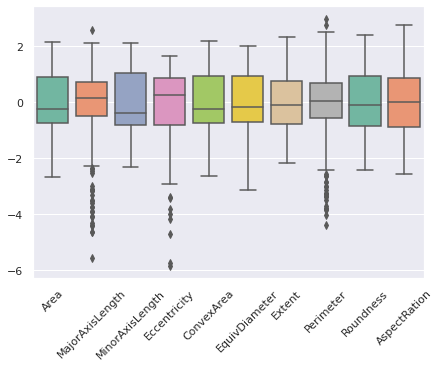

In [ ]:
ax = plt.figure()
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

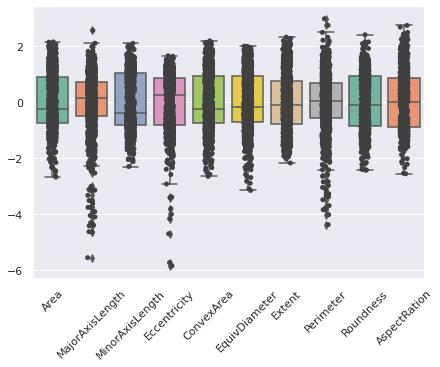

In [ ]:
ax = plt.figure()    
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25") 
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

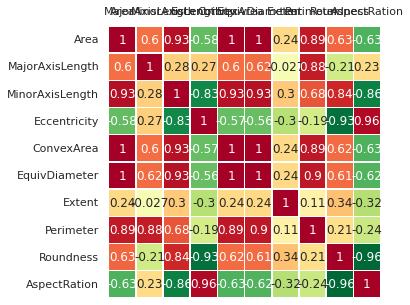

In [ ]:
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.5, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

# **Principal Component Analysis (PCA)**

In [ ]:
pca = PCA(0.95)
Z = pca.fit_transform(X)

print("Shape of X:", X.shape)
print("Shape of Z:", Z.shape)

Shape of X: (1136, 10)
Shape of Z: (1136, 3)


In [ ]:
pca.n_components_

3

In [ ]:
print(Z)

[[ 2.59627453  9.6551741  -0.51489657]
 [ 2.12943601  7.9734378  -0.81355383]
 [ 2.55871573  7.8115193  -0.662141  ]
 ...
 [ 1.14428443  0.2519718  -0.92805676]
 [-0.78530061 -1.72430002 -1.06498071]
 [-2.0997305  -3.8122943  -1.14805224]]


Text(0, 0.5, '$Z_2$')

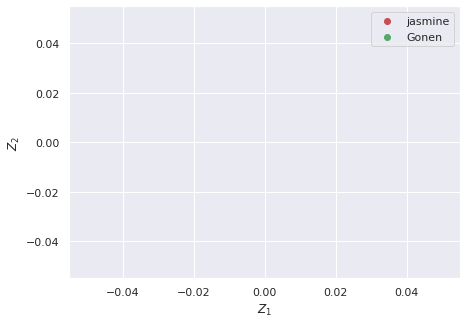

In [ ]:

idx_jasmine = np.where(y == 'jasmine')
idx_Gonen = np.where(y == 'Gonen')


plt. figure()
plt.scatter(Z[idx_jasmine, 0], Z[idx_jasmine, 1], c='r', label='jasmine')
plt.scatter(Z[idx_Gonen, 0], Z[idx_Gonen, 1], c='g', label='Gonen')

plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

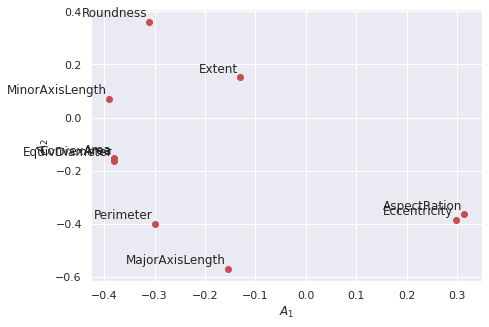

In [ ]:
A = pca.components_.T 

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')

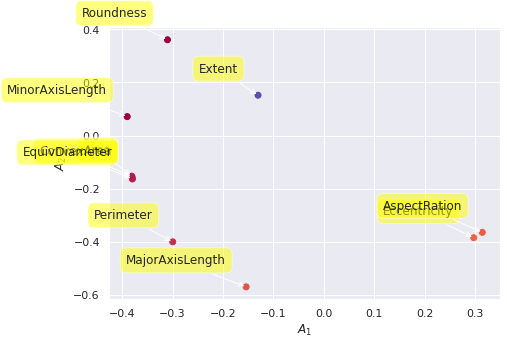

In [ ]:
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))
  


In [ ]:
print(A)

[[-0.38114336 -0.15312143 -0.02486782]
 [-0.15426105 -0.57014457  0.07705123]
 [-0.39003974  0.07119876 -0.06751135]
 [ 0.29694201 -0.38494043  0.11471859]
 [-0.38039089 -0.15724299 -0.02577263]
 [-0.37971559 -0.16366379 -0.02290395]
 [-0.13067643  0.15181093  0.97913718]
 [-0.29976899 -0.40058779  0.01006976]
 [-0.31021961  0.36070543 -0.0709845 ]
 [ 0.31396268 -0.36483402  0.10338243]]


**Scree plot**

Text(0, 0.5, 'Explained variance')

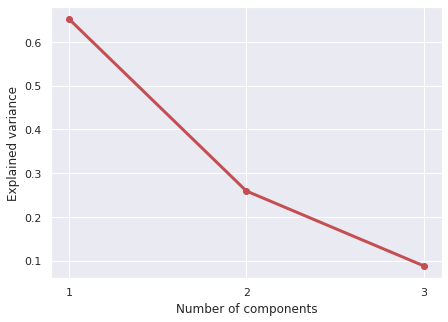

In [ ]:
#Eigenvalues
Lambda = pca.explained_variance_ 

#Scree plot
x = np.arange(len(Lambda)) + 1
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

**Explained Variance**

Proportion of Variance Explained :  [0.64484133 0.25592814 0.08665957]
Explained Variances (Percentage):  [64.48413339 25.59281353  8.66595693]


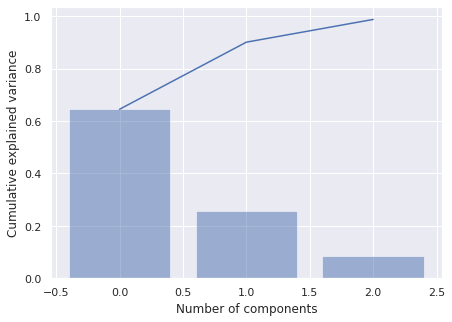

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')
print ("Proportion of Variance Explained : ", pca.explained_variance_ratio_)
print ("Explained Variances (Percentage): ", pca.explained_variance_ratio_ * 100)

**Biplot**

In [ ]:
A1 = A[:,0] 
A2 = A[:,1]
Z1 = Z[:,0] 
Z2 = Z[:,1]

plt.figure()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')

plt.scatter(Z[idx_jasmine,0], Z[idx_jasmine,1], c='r', label='jasmine')
plt.scatter(Z[idx_Gonen,0], Z[idx_Gonen,1], c='g', label='Gonen')
plt.legend(loc='upper left')

# **Using PCA Library**

In [ ]:
!pip install pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Created wheel for adjustText: filename=adjustText-0.7.3-py3-none-any.whl size=7096 sha256=989caca92808a65b1e4eea087e4737cf99a13570a8da2edb736c64e106df5958
  Stored in directory: /root/.cache/pip/wheels/06/b2/e0/b239bd2c0ff89b98c4f0c86a63e7059f38a8dfaf6df2641c63
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9674 sha256=a532621857744e08f7a94547d64d7274e9897df4976622c9981214463bf0ab22
  Stored in directory: /root/.cache/pip/wheels/bd/a8/c3/3cf2c14a1837a4e04bd98631724e81f33f462d86a1d895fae0
Successfully built adjustText wget


In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca()
# Fit transform
out = model.fit_transform(X)

[pca] >Processing dataframe..
[pca] >The PCA reduction is performed to capture [95.0%] explained variance using the [10] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [95.00%] explained variance.
[pca] >The PCA reduction is performed on the [10] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Outlier detection using SPE/DmodX with n_std=[2]


**Principal Components**

In [ ]:
out['PC']

,PC1,PC2,PC3
0,2.596275,9.655174,-0.514897
1,2.129436,7.973438,-0.813554
2,2.558716,7.811519,-0.662141
3,1.820286,7.016242,0.495970
4,1.318141,6.154836,-0.727717
...,...,...,...
1131,-0.764337,-0.166696,1.361945
1132,0.533645,-0.222543,-0.816484
1133,1.144284,0.251972,-0.928057
1134,-0.785301,-1.724300,-1.064981


**Scatter plot**

[colourmap]> Warning: Colormap [Set1] can not create [1136] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [1136] unique colors! Available unique colors: [9].
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


(<Figure size 1440x1080 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f2ade717a00>)

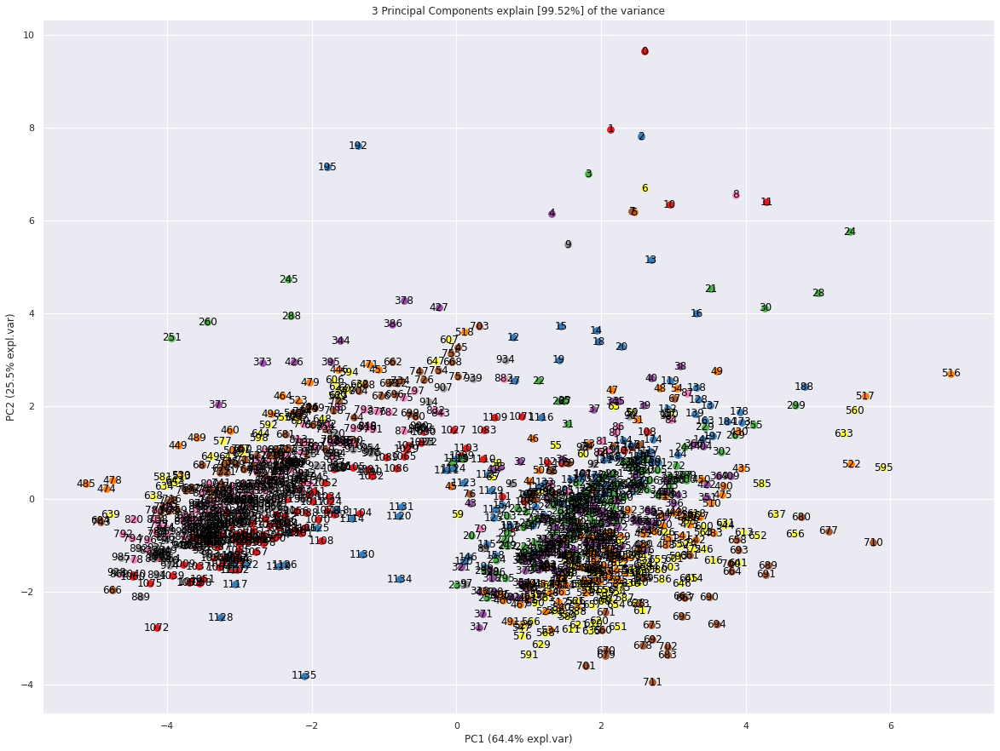

In [ ]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [ ]:
A = out['loadings'].T

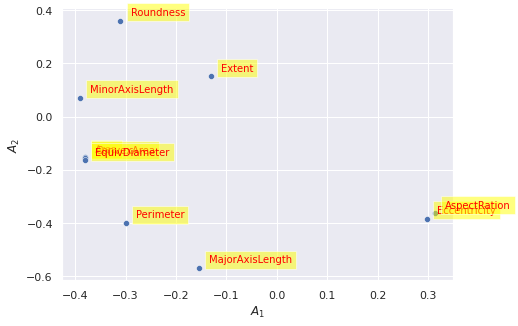

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

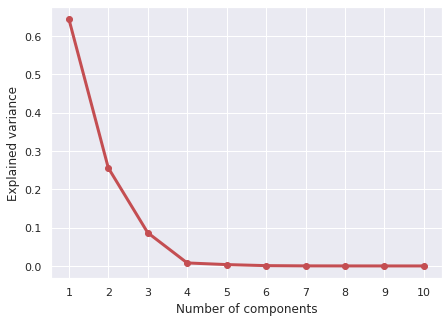

In [ ]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance') 
plt.show()

**Explained Variance Plot**

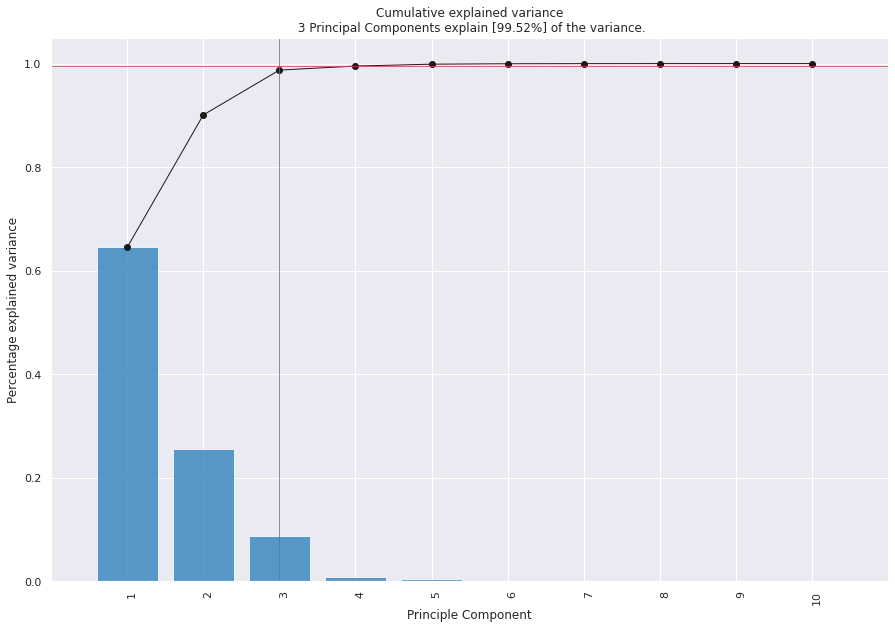

<Figure size 504x360 with 0 Axes>

In [ ]:
model.plot();

**Biplot**

[pca] >Plot PC1 vs PC2 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [1136] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [1136] unique colors! Available unique colors: [9].
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


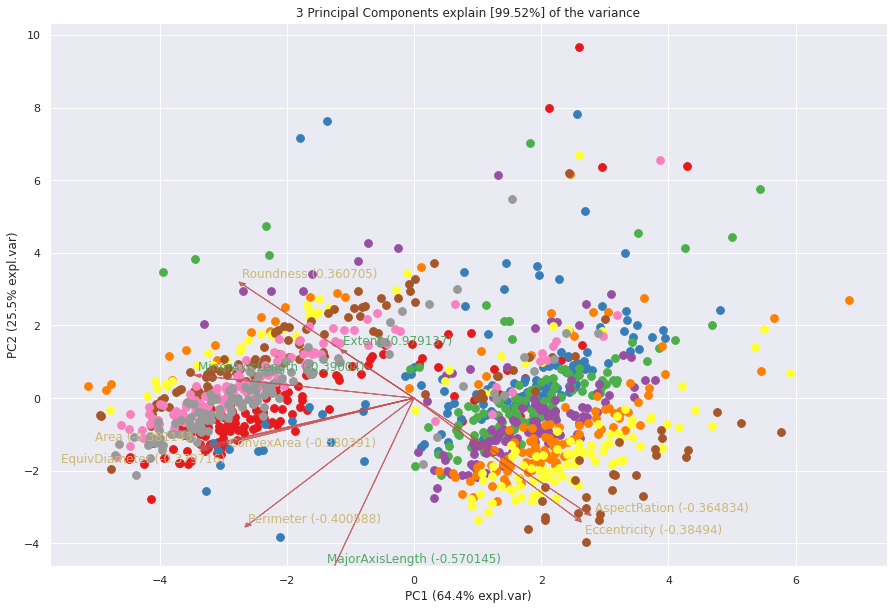

(<Figure size 1080x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f2ae761cca0>)

In [ ]:
model.biplot(label=False, legend=False)

[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[colourmap]> Warning: Colormap [Set1] can not create [1136] unique colors! Available unique colors: [9].
[colourmap]> Warning: Colormap [Set1] can not create [1136] unique colors! Available unique colors: [9].
[pca] >Set parameter "label=None" to ignore the labels and significanly speed up the scatter plot.


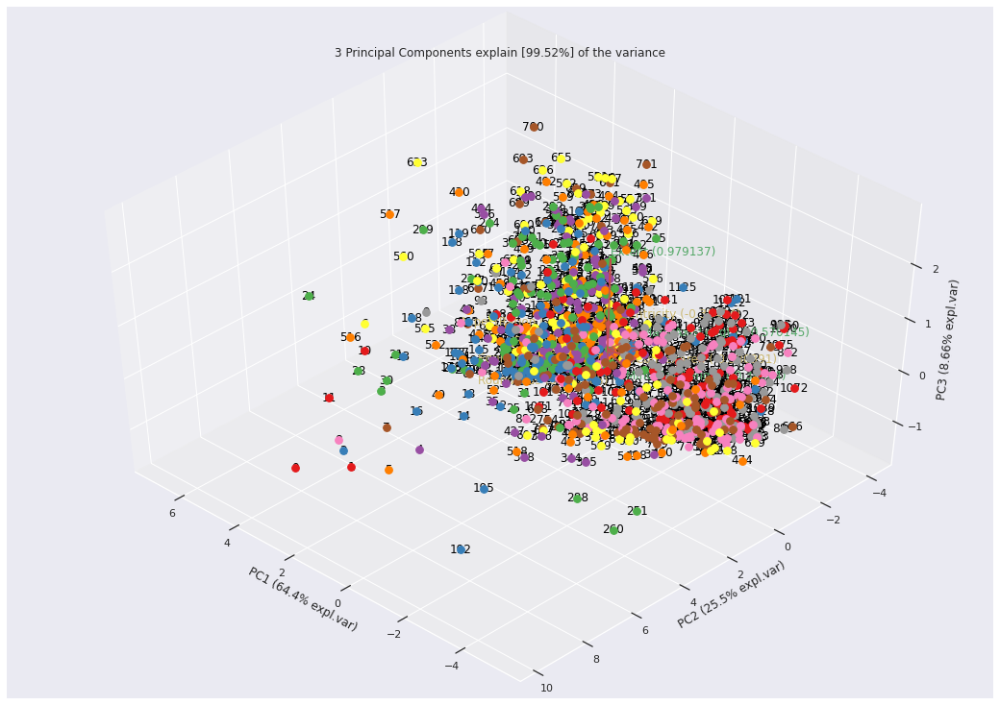

(<Figure size 1080x720 with 2 Axes>,
 <mpl_toolkits.mplot3d.axes3d.Axes3D at 0x7f2ae78175e0>)

In [ ]:
model.biplot3d(legend=False)

# **Classification**

**Using PyCaret**

In [ ]:
#For Google Colab only
from pycaret.utils import enable_colab 
enable_colab()

Colab mode enabled.


In [ ]:
#read cvs file into dataframe
df = pd.read_csv('https://raw.githubusercontent.com/ijazawan91/INSA6220/main/less%20rows%20gonen.csv')
df.head(25)

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,3393,84.058480,52.951486,0.776647,3477,65.727481,0.688515,224.485,0.846095,1.587462,jasmine
1,4038,95.247094,55.219372,0.814795,4126,71.703147,0.636106,244.287,0.850306,1.724885,jasmine
2,3899,95.376228,53.326678,0.829087,3977,70.458222,0.642128,240.440,0.847519,1.788527,jasmine
3,4399,102.448560,55.731542,0.839088,4496,74.839700,0.755842,257.268,0.835203,1.838251,jasmine
4,4893,108.983250,58.029991,0.846451,4979,78.930103,0.625224,268.932,0.850159,1.878050,jasmine
5,4357,104.168804,54.503692,0.852195,4432,74.481573,0.537968,260.732,0.805395,1.911225,jasmine
6,4105,101.842276,52.147372,0.858961,4241,72.295562,0.838440,254.662,0.795417,1.952970,jasmine
7,4371,106.036504,53.383240,0.864029,4460,74.601140,0.623716,256.509,0.834806,1.986326,jasmine
8,3641,98.218981,48.839391,0.867607,3726,68.087188,0.554946,241.542,0.784233,2.011061,jasmine
9,4881,113.816097,55.966749,0.870748,4965,78.833256,0.852725,275.478,0.808248,2.033638,jasmine


In [ ]:
df["Class"].unique()
print(df.count())

Area               1136
MajorAxisLength    1136
MinorAxisLength    1136
Eccentricity       1136
ConvexArea         1136
EquivDiameter      1136
Extent             1136
Perimeter          1136
Roundness          1136
AspectRation       1136
Class              1136
dtype: int64


In [ ]:
data = df.sample(frac=0.9, random_state=786)
print(data.count())
data_unseen = df.drop(data.index)

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Area               1022
MajorAxisLength    1022
MinorAxisLength    1022
Eccentricity       1022
ConvexArea         1022
EquivDiameter      1022
Extent             1022
Perimeter          1022
Roundness          1022
AspectRation       1022
Class              1022
dtype: int64
Data for Modeling: (1022, 11)
Unseen Data For Predictions: (114, 11)


In [ ]:
data_unseen

,Area,MajorAxisLength,MinorAxisLength,Eccentricity,ConvexArea,EquivDiameter,Extent,Perimeter,Roundness,AspectRation,Class
0,4357,104.168804,54.503692,0.852195,4432,74.481573,0.537968,260.732,0.805395,1.911225,jasmine
1,4371,106.036504,53.383240,0.864029,4460,74.601140,0.623716,256.509,0.834806,1.986326,jasmine
2,4449,111.255653,52.196047,0.883116,4558,75.263821,0.709569,269.177,0.771607,2.131496,jasmine
3,5985,132.789560,58.555671,0.897524,6140,87.294551,0.676730,316.690,0.749903,2.267749,jasmine
4,6400,143.233515,57.808928,0.914936,6558,90.270333,0.524676,336.418,0.710610,2.477706,jasmine
...,...,...,...,...,...,...,...,...,...,...,...
109,7313,149.121568,63.279494,0.905499,7517,96.494564,0.781137,350.275,0.749009,2.356554,Gonen
110,9153,167.042117,70.507122,0.906553,9318,107.953516,0.547166,389.499,0.758160,2.369152,Gonen
111,6737,144.434688,60.572896,0.907811,6864,92.616493,0.560529,336.286,0.748616,2.384477,Gonen
112,7015,147.121900,61.133489,0.909580,7165,94.508071,0.547619,346.053,0.736126,2.406568,Gonen


In [ ]:
print(data_unseen.count())

Area               114
MajorAxisLength    114
MinorAxisLength    114
Eccentricity       114
ConvexArea         114
EquivDiameter      114
Extent             114
Perimeter          114
Roundness          114
AspectRation       114
Class              114
dtype: int64


In [ ]:
print(data.index)

RangeIndex(start=0, stop=1022, step=1)


**Setting up the Environment in PyCaret**

In [ ]:
from pycaret.classification import *
clf = setup(data=data, target='Class', train_size=0.7, session_id=123)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,"Gonen: 0, jasmine: 1"
4,Original Data,"(1022, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='Class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('scaling', 'passthrough'), ('P_transform', 'passthrough'),
                ('binn', 'passthrough'), ('rem_outliers', 'passthrough'),
                ('cluste

**Comparing All Models**

In [ ]:
 best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.9902,0.9979,0.9897,0.9924,0.9910,0.9803,0.9805,0.377
qda,Quadratic Discriminant Analysis,0.9902,0.9998,0.9949,0.9875,0.9911,0.9803,0.9805,0.015
et,Extra Trees Classifier,0.9888,0.9997,0.9897,0.9901,0.9898,0.9774,0.9777,0.171
lightgbm,Light Gradient Boosting Machine,0.9874,0.9971,0.9897,0.9874,0.9885,0.9746,0.9748,0.147
lr,Logistic Regression,0.9860,0.9995,0.9872,0.9874,0.9872,0.9718,0.9720,0.353
nb,Naive Bayes,0.9860,0.9998,0.9974,0.9779,0.9874,0.9717,0.9723,0.018
dt,Decision Tree Classifier,0.9860,0.9859,0.9872,0.9874,0.9871,0.9719,0.9722,0.028
ada,Ada Boost Classifier,0.9860,0.9966,0.9897,0.9849,0.9872,0.9718,0.9720,0.112
gbc,Gradient Boosting Classifier,0.9860,0.9982,0.9897,0.9851,0.9872,0.9718,0.9721,0.168
lda,Linear Discriminant Analysis,0.9832,0.9996,0.9923,0.9780,0.9849,0.9660,0.9667,0.014


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

**Create a Model**

**Create Decision Tree Classifier**

In [ ]:
dt = create_model('dt')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9861,0.9848,1.0000,0.9750,0.9873,0.9720,0.9723
1,0.9722,0.9720,0.9744,0.9744,0.9744,0.9441,0.9441
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9722,0.9744,0.9487,1.0000,0.9737,0.9443,0.9458
4,0.9861,0.9848,1.0000,0.9750,0.9873,0.9720,0.9723
5,0.9859,0.9872,0.9744,1.0000,0.9870,0.9716,0.9720
6,0.9859,0.9872,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9859,0.9844,1.0000,0.9750,0.9873,0.9715,0.9719
8,0.9859,0.9844,1.0000,0.9750,0.9873,0.9715,0.9719
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:create_model() succesfully completed......................................


In [ ]:
dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

**Tune a Model:**

**Tune Decision Tree Model**

In [ ]:
tuned_dt = tune_model(dt)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9722,0.9841,0.9744,0.9744,0.9744,0.9441,0.9441
1,0.9722,0.9845,0.9744,0.9744,0.9744,0.9441,0.9441
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9861,0.9872,0.9744,1.0000,0.9870,0.9721,0.9725
4,0.9861,0.9848,1.0000,0.9750,0.9873,0.9720,0.9723
5,0.9859,0.9996,0.9744,1.0000,0.9870,0.9716,0.9720
6,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720
7,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_dt

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best')

**Evaluate Decision Tree Model**

**Update statmodels**

In [ ]:
!pip install statsmodels --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**How to analyze model performance using various plots**

In [ ]:
evaluate_model(tuned_dt)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=6, max_features=1.0, max_leaf_nodes=None,
                       min_impurity_decrease=0.0001, min_impurity_split=None,
                       min_samples_leaf=4, min_samples_split=10,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=123, splitter='best'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create K Neighbors Model**

In [ ]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9306,0.9782,0.9744,0.9048,0.9383,0.8592,0.8622
1,0.9583,0.9961,1.0000,0.9286,0.9630,0.9155,0.9188
2,0.9444,0.9946,0.9744,0.9268,0.9500,0.8876,0.8890
3,0.9444,0.9716,0.9231,0.9730,0.9474,0.8886,0.8900
4,0.9306,0.9662,1.0000,0.8864,0.9398,0.8585,0.8672
5,0.9437,0.9936,0.9487,0.9487,0.9487,0.8862,0.8862
6,0.9859,0.9992,1.0000,0.9750,0.9873,0.9715,0.9719
7,0.9718,0.9820,1.0000,0.9512,0.9750,0.9428,0.9443
8,0.9718,0.9824,0.9744,0.9744,0.9744,0.9431,0.9431
9,0.9577,0.9996,1.0000,0.9286,0.9630,0.9139,0.9173


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')
INFO:logs:create_model() succesfully completed......................................


**Tune K Neighbors Model**

In [ ]:
tuned_knn = tune_model(knn, custom_grid = {'n_neighbors' : np.arange(0,50,1)})

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9444,0.9530,0.9744,0.9268,0.9500,0.8876,0.8890
1,0.9861,0.9848,1.0000,0.9750,0.9873,0.9720,0.9723
2,0.9722,0.9833,0.9487,1.0000,0.9737,0.9443,0.9458
3,0.9583,0.9732,0.9231,1.0000,0.9600,0.9167,0.9199
4,0.9722,0.9697,1.0000,0.9512,0.9750,0.9438,0.9453
5,0.9718,0.9828,0.9744,0.9744,0.9744,0.9431,0.9431
6,0.9859,0.9996,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9718,0.9832,0.9744,0.9744,0.9744,0.9431,0.9431
8,0.9718,0.9716,0.9744,0.9744,0.9744,0.9431,0.9431
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 18
INFO:logs:master_model_container: 18
INFO:logs:display_container: 6
INFO:logs:KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=2, p=2,
                     weights='uniform')
INFO:logs:tune_model() succesfully completed......................................


**Evaluate K Neighbors Model**

In [ ]:
evaluate_model(tuned_knn)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=2, p=2,
                     weights='uniform'), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Logistic Regression Model**

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9861,0.9969,1.0000,0.9750,0.9873,0.9720,0.9723
1,0.9722,0.9984,0.9744,0.9744,0.9744,0.9441,0.9441
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9861,1.0000,0.9744,1.0000,0.9870,0.9721,0.9725
4,0.9861,1.0000,1.0000,0.9750,0.9873,0.9720,0.9723
5,0.9718,0.9992,0.9744,0.9744,0.9744,0.9431,0.9431
6,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720


INFO:logs:create_model_container: 19
INFO:logs:master_model_container: 19
INFO:logs:display_container: 7
INFO:logs:LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=1000,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune Logistic Regression Model**

In [ ]:
tuned_lr = tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9722,0.9961,0.9744,0.9744,0.9744,0.9441,0.9441
1,0.9722,0.9992,0.9744,0.9744,0.9744,0.9441,0.9441
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9861,1.0000,0.9744,1.0000,0.9870,0.9721,0.9725
4,0.9861,1.0000,1.0000,0.9750,0.9873,0.9720,0.9723
5,0.9859,0.9992,1.0000,0.9750,0.9873,0.9715,0.9719
6,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720


INFO:logs:create_model_container: 20
INFO:logs:master_model_container: 20
INFO:logs:display_container: 8
INFO:logs:LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Logistic Regression Model**

In [ ]:
evaluate_model(tuned_lr)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=LogisticRegression(C=0.049, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

**Create Random Forest Model**

In [ ]:
rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9861,0.9977,1.0000,0.9750,0.9873,0.9720,0.9723
1,0.9722,0.9821,0.9744,0.9744,0.9744,0.9441,0.9441
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9861,0.9988,0.9744,1.0000,0.9870,0.9721,0.9725
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720
6,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 21
INFO:logs:master_model_container: 21
INFO:logs:display_container: 9
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


**Tune Random Forest Model**

In [ ]:
tuned_rf = tune_model(rf)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9861,0.9992,1.0000,0.9750,0.9873,0.9720,0.9723
1,0.9722,0.9961,0.9744,0.9744,0.9744,0.9441,0.9441
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9861,0.9984,0.9744,1.0000,0.9870,0.9721,0.9725
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 22
INFO:logs:master_model_container: 22
INFO:logs:display_container: 10
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate Random Forest Model**

In [ ]:
evaluate_model(tuned_rf)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Tune the Best Model**

In [ ]:
tuned_best_model = tune_model(best_model)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9861,0.9992,1.0000,0.9750,0.9873,0.9720,0.9723
1,0.9722,0.9961,0.9744,0.9744,0.9744,0.9441,0.9441
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9861,0.9984,0.9744,1.0000,0.9870,0.9721,0.9725
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
6,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
8,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 23
INFO:logs:master_model_container: 23
INFO:logs:display_container: 11
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**Evaluate the Best Model**

In [ ]:
tuned_best_model

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)

In [ ]:
evaluate_model(tuned_best_model)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Classification + PCA**

In [ ]:
clf_pca = setup(data=data, target='Class', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,session_id,123
1,Target,Class
2,Target Type,Binary
3,Label Encoded,"Gonen: 0, jasmine: 1"
4,Original Data,"(1022, 11)"
5,Missing Values,False
6,Numeric Features,10
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=True, features_todrop=[],
                                      id_columns=[],
                                      ml_usecase='classification',
                                      numerical_features=[], target='Class',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='not_available',
                                fill_value_categorical=None,
                                fill_value_numerical=None,
                                numeric_strate...
                ('dummy', Dummify(target='Class')),
                ('fix_perfect', Remove_100(target='Class')),
                ('clean_names', Clean_Colum_Names()),
       

In [ ]:
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ada,Ada Boost Classifier,0.9860,0.9984,0.9897,0.9849,0.9872,0.9718,0.9720,0.101
et,Extra Trees Classifier,0.9860,0.9995,0.9897,0.9850,0.9872,0.9718,0.9721,0.180
lr,Logistic Regression,0.9846,0.9993,0.9897,0.9826,0.9860,0.9690,0.9694,0.017
qda,Quadratic Discriminant Analysis,0.9846,0.9996,0.9949,0.9778,0.9861,0.9689,0.9695,0.012
lightgbm,Light Gradient Boosting Machine,0.9846,0.9994,0.9897,0.9826,0.9860,0.9689,0.9692,0.054
gbc,Gradient Boosting Classifier,0.9833,0.9982,0.9846,0.9851,0.9846,0.9662,0.9668,0.109
knn,K Neighbors Classifier,0.9832,0.9965,0.9872,0.9824,0.9847,0.9661,0.9664,0.024
dt,Decision Tree Classifier,0.9832,0.9834,0.9821,0.9874,0.9846,0.9662,0.9666,0.013
rf,Random Forest Classifier,0.9832,0.9981,0.9872,0.9823,0.9846,0.9661,0.9665,0.220
svm,SVM - Linear Kernel,0.9805,0.0000,0.9846,0.9803,0.9822,0.9605,0.9611,0.012


INFO:logs:create_model_container: 14
INFO:logs:master_model_container: 14
INFO:logs:display_container: 2
INFO:logs:AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=123)
INFO:logs:compare_models() succesfully completed......................................


In [ ]:
best_model_pca

AdaBoostClassifier(algorithm='SAMME.R', base_estimator=None, learning_rate=1.0,
                   n_estimators=50, random_state=123)

**Tune the Best Model**

In [ ]:
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9861,0.9992,1.0000,0.9750,0.9873,0.9720,0.9723
1,0.9722,0.9864,0.9744,0.9744,0.9744,0.9441,0.9441
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9861,1.0000,0.9744,1.0000,0.9870,0.9721,0.9725
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9859,0.9992,1.0000,0.9750,0.9873,0.9715,0.9719
6,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9859,0.9996,1.0000,0.9750,0.9873,0.9715,0.9719
8,0.9859,0.9996,1.0000,0.9750,0.9873,0.9715,0.9719
9,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000


INFO:logs:create_model_container: 15
INFO:logs:master_model_container: 15
INFO:logs:display_container: 3
INFO:logs:AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.4,
                   n_estimators=60, random_state=123)
INFO:logs:tune_model() succesfully completed......................................


In [ ]:
tuned_best_model_pca

AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.4,
                   n_estimators=60, random_state=123)

**Evaluate the Best Model**

In [ ]:
evaluate_model(tuned_best_model_pca)

INFO:logs:Initializing evaluate_model()
INFO:logs:evaluate_model(estimator=AdaBoostClassifier(algorithm='SAMME', base_estimator=None, learning_rate=0.4,
                   n_estimators=60, random_state=123), fold=None, fit_kwargs=None, plot_kwargs=None, feature_name=None, groups=None, use_train_data=False)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Hyperparameters', 'param…

# **Explainable AI with Shapley values**

In [ ]:
!pip install shap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import shap

In [ ]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9861,0.9903,1.0000,0.9750,0.9873,0.9720,0.9723
1,0.9583,0.9930,0.9487,0.9737,0.9610,0.9163,0.9166
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9861,1.0000,0.9744,1.0000,0.9870,0.9721,0.9725
4,0.9861,1.0000,1.0000,0.9750,0.9873,0.9720,0.9723
5,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
6,0.9718,0.9988,0.9744,0.9744,0.9744,0.9431,0.9431
7,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
8,0.9859,0.9992,1.0000,0.9750,0.9873,0.9715,0.9719
9,0.9859,1.0000,0.9744,1.0000,0.9870,0.9716,0.9720


INFO:logs:create_model_container: 16
INFO:logs:master_model_container: 16
INFO:logs:display_container: 4
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=123, verbose=0,
                       warm_start=False)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9861,0.9984,1.0000,0.9750,0.9873,0.9720,0.9723
1,0.9583,0.9899,0.9487,0.9737,0.9610,0.9163,0.9166
2,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
3,0.9722,1.0000,0.9487,1.0000,0.9737,0.9443,0.9458
4,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000,1.0000
5,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
6,0.9859,0.9992,0.9744,1.0000,0.9870,0.9716,0.9720
7,0.9859,0.9992,1.0000,0.9750,0.9873,0.9715,0.9719
8,0.9859,1.0000,1.0000,0.9750,0.9873,0.9715,0.9719
9,0.9859,0.9992,0.9744,1.0000,0.9870,0.9716,0.9720


INFO:logs:create_model_container: 17
INFO:logs:master_model_container: 17
INFO:logs:display_container: 5
INFO:logs:RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False)
INFO:logs:tune_model() succesfully completed......................................


**SHAP Summary Plot**

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=summary, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: summary
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


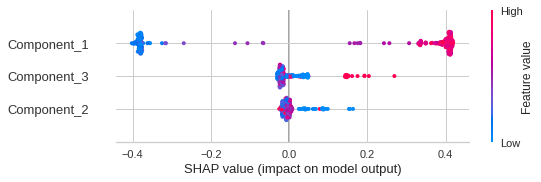

INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


In [ ]:
interpret_model(tuned_rf_pca, plot='summary')

**Visualize a single prediction**

In [ ]:
interpret_model(tuned_rf_pca, plot='reason', observation=32)

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=32, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values
INFO:logs:model type detected: Unknown


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................


**Visualize many predictions**

In [ ]:
interpret_model(tuned_rf_pca, plot='reason')

INFO:logs:Initializing interpret_model()
INFO:logs:interpret_model(estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                       class_weight='balanced_subsample', criterion='entropy',
                       max_depth=4, max_features='log2', max_leaf_nodes=None,
                       max_samples=None, min_impurity_decrease=0.0002,
                       min_impurity_split=None, min_samples_leaf=5,
                       min_samples_split=9, min_weight_fraction_leaf=0.0,
                       n_estimators=130, n_jobs=-1, oob_score=False,
                       random_state=123, verbose=0, warm_start=False), use_train_data=False, X_new_sample=None, y_new_sample=None, feature=None, kwargs={}, observation=None, plot=reason, save=False)
INFO:logs:Checking exceptions
INFO:logs:plot type: reason
INFO:logs:model type detected: type 1
INFO:logs:Creating TreeExplainer
INFO:logs:Compiling shap values


INFO:logs:Visual Rendered Successfully
INFO:logs:interpret_model() succesfully completed......................................
